In [78]:
library(dplyr)   
library(caret)
library(tidyverse)
library(car)
library(MASS) # for chisq
library(descr) # for crosstable

options(repr.plot.width = 20, repr.plot.height =10, repr.plot.res = 500)

load(file = "C:/Users/abonini/Desktop/Analysis/Sources/LIVERTRANSPLANT/Modello/df_iniziale.Rdata")
df <- DatiUsati1
rm(DatiUsati1)

In [79]:
load(file = "C:/Users/abonini/Desktop/Analysis/Sources/LIVERTRANSPLANT/Modello/val_score.Rdata")
df_val <- val_score
rm(val_score) #dati 2022

In [80]:
df <- df[c("patientKey","icuAdmDate__icuAdmDate","icuAdmDate__icuAdmTime","centreCode","genderClear","age","degenzaPreTra","admWard_RIC_PED",
           "typeStatus_RIC","pulmonarHypertension","epatopulmonarSyndrome",
           "BleedingEsophagGastric","prevLiverTransplant","presentRefractAscites","tipps",
           "thrombosisDegreeWithNone","portosystEncephalPresent","nutritStatus",
           "surgeonSurgery","mechanicVentilation","clifSofaForCardio","albumInfusOver7Days",
           "bilirubinaTotale","INR","serumCreatinine","Sodiemia","ratioPaO2FiO2","platCountTranspl","albumina",
           "surgeryDuration","IntraoperativTransfected","plasmaFresco","plasmaPools","doseFibrinogen","CRIOprecipitated",
           "useEmorecuper","CristalloidiComp","ColloidiComp","Albumina50Comp",
           "noradrenalineEndSurger","intermedLactates","coldIschemia","syndromeReperfus",
           "shuntPortedTemp", "anastomTechnic","venousBypass","bileAnastomosis","abdomOpenEndSurg",
           "organDonorSex","organDonorType","organDonorSampleTechnic","organDonorECMO",
           "regionalPerfusion","organDonorBiopsy","organDonorRecondOrgan",
           "organDonorProvenance","organDonorCauseOfDeath","organDonorAge", "organDonorHeight",
           "organDonorDrawalSodiemia","organDonorGammaGT","realMELD","realMELDNa","DRI","EDRI", "degenzaPostTraOSP",
           "hospOutcome_RIC","icuMortality",
           "liverDisords_buddChiariSyndrome","liverDisords_cirrhosisAlcoholic","liverDisords_cirrhosisAutoimmune","liverDisords_cirrhosisBiliaryPrimitiv",
              "liverDisords_cirrhosisBiliarySecond","liverDisords_cirrhosisCryptogenetic","liverDisords_cirrhosisDrugs","liverDisords_cirrhosisOtherRaison",
              "liverDisords_cirrhosisVirusB","liverDisords_cirrhosisVirusC","liverDisords_cirrhosisVirusD","liverDisords_cirrhosisVirusOther","liverDisords_extraEpathiBileDucts",
              "liverDisords_HCCstageI","liverDisords_HCCstageII","liverDisords_Hemochromatosis","liverDisords_hepatFulm","liverDisords_NASHpathology",
              "liverDisords_otherCholestaticDisease","liverDisords_otherCongenitBilia","liverDisords_otherIndication","liverDisords_polycysticDisease",
              "liverDisords_primitScleroColangitis","liverDisords_subAcute","liverDisords_wilsonDisease",
          "tip_ritr","oxygenTherapy","frequency","degree","organDonorMaastricht",
           "organDonorSteadyMacroscopic","organDonorRecondHypoNormoter",
          "comorbidities_none_RIC","comorbidities_asthma_RIC","comorbidities_modCOPD_RIC","comorbidities_sevCOPD_RIC",
        "comorbidities_restLunDis_RIC","comorbidities_hypertension_RIC","comorbidities_myocard_RIC","comorbidities_heartFail2_RIC",
        "comorbidities_heartFail4_RIC","comorbidities_arrhythmia_RIC","comorbidities_perVascDis_RIC","comorbidities_dementia_RIC",
        "comorbidities_cerDis_RIC","comorbidities_hemiParaQuadr_RIC","comorbidities_neuro_RIC","comorbidities_modRenal_RIC",
        "comorbidities_diab1_RIC","comorbidities_diab2NoIns_RIC","comorbidities_diab2Ins_RIC","comorbidities_drugIndCoag_RIC",
        "comorbidities_antiaggrTherapy_RIC","comorbidities_severePsychosis_RIC")]

In [81]:
df_val <- df_val[c("patientKey","icuAdmDate__icuAdmDate","icuAdmDate__icuAdmTime","centreCode","genderClear","age","degenzaPreTra","admWard_RIC_PED",
           "typeStatus_RIC","pulmonarHypertension","epatopulmonarSyndrome",
           "BleedingEsophagGastric","prevLiverTransplant","presentRefractAscites","tipps",
           "thrombosisDegreeWithNone","portosystEncephalPresent","nutritStatus",
           "surgeonSurgery","mechanicVentilation","clifSofaForCardio","albumInfusOver7Days",
           "bilirubinaTotale","INR","serumCreatinine","Sodiemia","ratioPaO2FiO2","platCountTranspl","albumina",
           "surgeryDuration","IntraoperativTransfected","plasmaFresco","plasmaPools","doseFibrinogen","CRIOprecipitated",
           "useEmorecuper","CristalloidiComp","ColloidiComp","Albumina50Comp",
           "noradrenalineEndSurger","intermedLactates","coldIschemia","syndromeReperfus",
           "shuntPortedTemp", "anastomTechnic","venousBypass","bileAnastomosis","abdomOpenEndSurg",
           "organDonorSex","organDonorType","organDonorSampleTechnic","organDonorECMO",
           "regionalPerfusion","organDonorBiopsy","organDonorRecondOrgan",
           "organDonorProvenance","organDonorCauseOfDeath","organDonorAge", "organDonorHeight",
           "organDonorDrawalSodiemia","organDonorGammaGT","realMELD","realMELDNa","DRI","EDRI", "degenzaPostTraOSP",
           "hospOutcome_RIC","icuMortality",
           "liverDisords_buddChiariSyndrome","liverDisords_cirrhosisAlcoholic","liverDisords_cirrhosisAutoimmune","liverDisords_cirrhosisBiliaryPrimitiv",
              "liverDisords_cirrhosisBiliarySecond","liverDisords_cirrhosisCryptogenetic","liverDisords_cirrhosisDrugs","liverDisords_cirrhosisOtherRaison",
              "liverDisords_cirrhosisVirusB","liverDisords_cirrhosisVirusC","liverDisords_cirrhosisVirusD","liverDisords_cirrhosisVirusOther","liverDisords_extraEpathiBileDucts",
              "liverDisords_HCCstageI","liverDisords_HCCstageII","liverDisords_Hemochromatosis","liverDisords_hepatFulm","liverDisords_NASHpathology",
              "liverDisords_otherCholestaticDisease","liverDisords_otherCongenitBilia","liverDisords_otherIndication","liverDisords_polycysticDisease",
              "liverDisords_primitScleroColangitis","liverDisords_subAcute","liverDisords_wilsonDisease",
          "tip_ritr","oxygenTherapy","frequency","degree","organDonorMaastricht",
           "organDonorSteadyMacroscopic","organDonorRecondHypoNormoter",
          "comorbidities_none_RIC","comorbidities_asthma_RIC","comorbidities_modCOPD_RIC","comorbidities_sevCOPD_RIC",
        "comorbidities_restLunDis_RIC","comorbidities_hypertension_RIC","comorbidities_myocard_RIC","comorbidities_heartFail2_RIC",
        "comorbidities_heartFail4_RIC","comorbidities_arrhythmia_RIC","comorbidities_perVascDis_RIC","comorbidities_dementia_RIC",
        "comorbidities_cerDis_RIC","comorbidities_hemiParaQuadr_RIC","comorbidities_neuro_RIC","comorbidities_modRenal_RIC",
        "comorbidities_diab1_RIC","comorbidities_diab2NoIns_RIC","comorbidities_diab2Ins_RIC","comorbidities_drugIndCoag_RIC",
        "comorbidities_antiaggrTherapy_RIC","comorbidities_severePsychosis_RIC")]

In [82]:
df <- rbind(df,df_val) #unisco dati 2018-2021 con quelli del 2022

In [83]:
# colestatiche




df <-  df %>% 
  mutate(colestatiche = case_when(liverDisords_cirrhosisBiliaryPrimitiv==1|liverDisords_cirrhosisBiliarySecond==1|
                                  liverDisords_primitScleroColangitis==1|
          liverDisords_extraEpathiBileDucts==1|liverDisords_otherCongenitBilia==1|
                                  liverDisords_otherCholestaticDisease==1~ 1,
                                  TRUE~ 0))

df$colestatiche <- as.factor(df$colestatiche)

df <- subset(df, select= - c(liverDisords_cirrhosisBiliaryPrimitiv,liverDisords_cirrhosisBiliarySecond,
                             liverDisords_primitScleroColangitis,liverDisords_extraEpathiBileDucts,
                            liverDisords_otherCongenitBilia, liverDisords_otherCholestaticDisease))



#rare

df <-  df %>% 
  mutate(rare = case_when(liverDisords_Hemochromatosis == 1|liverDisords_cirrhosisCryptogenetic == 1|
    liverDisords_cirrhosisOtherRaison == 1|liverDisords_otherIndication == 1|liverDisords_wilsonDisease == 1|
    liverDisords_cirrhosisDrugs == 1| liverDisords_buddChiariSyndrome == 1 | 
                          liverDisords_polycysticDisease == 1 | liverDisords_cirrhosisAutoimmune == 1 ~ 1,
                          TRUE ~ 0))

df$rare <- as.factor(df$rare)

df <- subset(df, select= - c(liverDisords_Hemochromatosis,liverDisords_cirrhosisCryptogenetic,
                             liverDisords_cirrhosisOtherRaison,liverDisords_otherIndication,liverDisords_wilsonDisease,
                            liverDisords_buddChiariSyndrome,liverDisords_polycysticDisease,liverDisords_cirrhosisAutoimmune))


#virali

df <-  df %>% 
  mutate(virali = case_when(liverDisords_cirrhosisVirusC == 1|liverDisords_cirrhosisVirusB == 1|
                            liverDisords_cirrhosisVirusD == 1|
                            liverDisords_cirrhosisVirusOther == 1 ~ 1,
                            TRUE ~ 0))

df$virali <- as.factor(df$virali)

df <- subset(df, select= - c(liverDisords_cirrhosisVirusC,liverDisords_cirrhosisVirusB,
                             liverDisords_cirrhosisVirusD,liverDisords_cirrhosisVirusOther))



#tumore

df <-  df %>% 
  mutate(tumore = case_when(liverDisords_HCCstageI == 1 | liverDisords_HCCstageII == 1 ~ 1,                 
                            TRUE ~ 0))

df$tumore <- as.factor(df$tumore)

df <- subset(df, select= - c(liverDisords_HCCstageI,liverDisords_HCCstageII))

In [84]:
#respiratorie

df <- df %>% 
    mutate(comorbidities_respiratorie = ifelse( comorbidities_asthma_RIC == 1 | comorbidities_modCOPD_RIC == 1 |
                                               comorbidities_sevCOPD_RIC == 1 | comorbidities_restLunDis_RIC == 1 |
                                               oxygenTherapy == "responsYes", 1, 0))

df$comorbidities_respiratorie <- as.factor(df$comorbidities_respiratorie)
df <- subset(df, select = -c(comorbidities_asthma_RIC,comorbidities_modCOPD_RIC, comorbidities_sevCOPD_RIC, 
                             comorbidities_restLunDis_RIC, oxygenTherapy ))






#cardiovascolari

df <- df %>% 
    mutate(comorbidities_cardiovascolari = ifelse( comorbidities_myocard_RIC == 1 | comorbidities_heartFail2_RIC == 1 |
                                               comorbidities_heartFail4_RIC == 1 | comorbidities_arrhythmia_RIC == 1 |
                                               comorbidities_perVascDis_RIC == 1, 1, 0))

df$comorbidities_cardiovascolari <- as.factor(df$comorbidities_cardiovascolari)
df <- subset(df, select = -c(comorbidities_myocard_RIC,comorbidities_heartFail2_RIC, comorbidities_heartFail4_RIC, 
                             comorbidities_arrhythmia_RIC, comorbidities_perVascDis_RIC ))


#neurologiche

df <- df %>% 
    mutate(comorbidities_neurologiche = ifelse( comorbidities_dementia_RIC == 1 | comorbidities_cerDis_RIC == 1 |
                                               comorbidities_hemiParaQuadr_RIC == 1 | comorbidities_neuro_RIC == 1 , 1, 0))

df$comorbidities_neurologiche <- as.factor(df$comorbidities_neurologiche)
df <- subset(df, select = -c(comorbidities_dementia_RIC,comorbidities_cerDis_RIC, comorbidities_hemiParaQuadr_RIC, 
                             comorbidities_neuro_RIC))


#renali

df <- df %>% 
    mutate(comorbidities_renali = ifelse( comorbidities_modRenal_RIC == 1 | comorbidities_modRenal_RIC == 1, 1, 0))

df$comorbidities_renali <- as.factor(df$comorbidities_renali)
df <- subset(df, select = -c(comorbidities_modRenal_RIC,comorbidities_modRenal_RIC))


#endocrine

df <-  df %>% 
  mutate(comorbidities_diabete = case_when(comorbidities_diab2NoIns_RIC == 1 ~ 1,
  comorbidities_diab1_RIC == 0 & comorbidities_diab2Ins_RIC == 0 & comorbidities_diab2NoIns_RIC == 0 ~ 0,
  comorbidities_diab1_RIC == 1 |comorbidities_diab2Ins_RIC == 1 ~ 2))

df$comorbidities_diabete <- as.factor(df$comorbidities_diabete)
df <- subset(df, select= - c(comorbidities_diab1_RIC,comorbidities_diab2Ins_RIC,comorbidities_diab2NoIns_RIC))

#scoagulazione

df <- df %>% 
    mutate(comorbidities_scoagulazione = ifelse( comorbidities_drugIndCoag_RIC == 1 |
                                                comorbidities_antiaggrTherapy_RIC == 1 , 1, 0))

df$comorbidities_scoagulazione <- as.factor(df$comorbidities_scoagulazione)
df <- subset(df, select = -c(comorbidities_drugIndCoag_RIC,comorbidities_antiaggrTherapy_RIC))

In [85]:
aggregate(sapply(df,class), by=list(sapply(df,class)), FUN=length)

Group.1,x
character,3
Date,1
factor,57
numeric,31


In [86]:
colnames(select_if(df, function(col) is.character(col)))

[1] "patientKey"             "icuAdmDate__icuAdmTime" "centreCode"

In [87]:
df$CentreCode <- as.factor(df$centreCode)

In [88]:
tmp <- unname(unlist(quantile(df$degenzaPostTraOSP, probs = c(0.9), na.rm=TRUE)))
df <- df %>% mutate(degenzaPostTraOSP = case_when(hospOutcome_RIC  %in% "hospDead" ~ tmp,
                                                  icuMortality %in% 1 ~ tmp,
                                                  TRUE ~ degenzaPostTraOSP))  #add penalty in degenzaPostTraOSP for patients who died

In [89]:
df1 <- df %>% filter(degenzaPostTraOSP <= 12)

df2 <- df %>% filter(degenzaPostTraOSP > 12)

In [90]:
paste("I pazienti con degenza minore o uguale a 12 giorni sono", nrow(df1))
paste("I pazienti con degenza superiore a 12 giorni", nrow(df2))

[1] "I pazienti con degenza minore o uguale a 12 giorni sono 435"

[1] "I pazienti con degenza superiore a 12 giorni 926"

In [91]:
# Data

print("<= 12")
summary(df1$icuAdmDate__icuAdmDate)

print("> 12")
summary(df2$icuAdmDate__icuAdmDate)

[1] "<= 12"


Min.      1st Qu.       Median         Mean      3rd Qu.         Max. 
"2018-10-23" "2020-01-31" "2021-02-03" "2020-12-03" "2021-08-21" "2022-12-02"

[1] "> 12"


Min.      1st Qu.       Median         Mean      3rd Qu.         Max. 
"2018-09-26" "2020-01-03" "2020-11-07" "2020-11-05" "2021-09-13" "2022-11-30"

In [92]:
# Orario (è una variabile "character" quindi posso confrontare solo in questo modo senza fare ulteriori modifche)

print("<= 12")
table(df1$icuAdmDate__icuAdmTime)

print("> 12")
table(df2$icuAdmDate__icuAdmTime)

[1] "<= 12"



00:05 00:10 00:15 00:28 00:30 00:34 00:45 00:50 01:00 01:15 01:25 01:26 01:29 
    1     1     2     1     2     1     1     1     3     1     2     1     1 
01:30 01:35 01:45 01:53 01:57 02:00 02:10 02:15 02:30 02:45 02:49 03:00 03:07 
    4     1     2     1     1     4     1     2     2     1     1     2     1 
03:10 03:18 03:36 03:43 03:45 03:56 04:00 04:30 04:33 04:35 05:00 05:05 05:10 
    1     1     1     1     1     1     3     2     1     1     1     1     1 
05:53 06:00 06:25 06:27 06:30 06:59 07:30 08:30 08:49 09:30 10:00 10:10 10:30 
    1     1     1     1     2     1     1     1     1     1     5     2     1 
11:00 11:19 11:24 11:30 11:58 12:00 12:03 12:05 12:15 12:21 12:30 12:32 12:35 
    1     1     1     1     1     4     1     1     1     1     1     1     1 
12:36 12:42 12:58 13:00 13:02 13:04 13:10 13:16 13:27 13:30 13:33 13:35 13:45 
    1     1     1     3     2     1     1     1     1     5     1     1     1 
13:46 13:48 13:50 13:52 13:55 13:56 13:57 14:00 14:

[1] "> 12"



00:00 00:10 00:15 00:20 00:23 00:30 00:35 00:40 00:45 00:50 00:56 01:00 01:10 
    1     1     1     4     1     4     1     1     1     2     1     9     1 
01:17 01:23 01:24 01:29 01:30 01:35 01:40 01:42 01:45 01:50 02:00 02:10 02:28 
    1     1     1     1     9     1     1     1     2     1     5     1     1 
02:30 02:40 03:00 03:29 03:30 03:40 03:50 03:53 04:00 04:07 04:15 04:25 04:30 
    1     1     5     1     4     1     3     1     5     1     1     1     4 
04:36 04:56 05:00 05:15 05:18 05:30 05:41 05:47 05:50 06:00 06:13 06:20 06:22 
    1     1     4     1     1     1     1     1     1     3     1     1     1 
06:30 06:45 07:00 07:01 07:07 07:10 07:11 07:15 07:25 07:27 07:30 07:33 07:35 
    2     2     3     1     1     3     1     1     1     1     2     1     1 
08:00 08:09 08:24 08:30 08:50 09:25 09:42 10:00 10:03 10:04 10:10 10:14 10:20 
    6     1     1     3     2     1     1     7     1     1     1     1     2 
10:30 10:51 11:00 11:10 11:19 11:24 11:30 11:35 11:

In [93]:
descrittiva_discrete <- function(df1, df2){
        column_names <- colnames(df1)
        
        for (column in column_names) {
            
            par(mfrow=c(1,2))
            barplot(table(df1[[column]])/nrow(df1), main="<= 12", col="blue", ylim = c(0, 1))

            barplot(table(df2[[column]])/nrow(df2), main="> 12", col="blue", ylim = c(0, 1))
            
            
            mtext(column, side = 3, line = - 2, outer = TRUE)
            
        }
        
}




descrittiva_continue <- function(df1, df2){
        column_names <- colnames(df1)
        
        for (column in column_names) {


            print("<= 12")
            print(column)
            print(summary(df1[[column]]))

            print("> 12")
            print(column)
            print(summary(df2[[column]]))
            print(wilcox.test(df1[[column]], df2[[column]]))
            
            cat("\n\n\n\n")
            
        }
}

descrittiva_discrete2 <- function(df1, df2){
        column_names <- colnames(df1)
        
        for (column in column_names) {

            a <- table(factor(df1[[column]], levels = union(names(table(df2[[column]])),names(table(df1[[column]])))))
            b <- table(df2[[column]])
            
            print(column)
            print("<= 12")
            print(prop.table(a))
            
            print("> 12")
            print(prop.table(b))
        
            print(ks.test(a,b))
            
            cat("\n\n\n\n")
    }
}


descrittiva_discrete3 <- function(df1, df2){
        column_names <- colnames(df1)
        
        for (column in column_names) {

            a <- table(factor(df1[[column]], levels = union(names(table(df2[[column]])),names(table(df1[[column]])))))
            b <- table(df2[[column]])
            
            print(column)
        
            print(CrossTable(rbind(a, b),
           fisher = T, chisq = T, expected = T,
           prop.c = F, prop.t = F, prop.chisq = F, 
           sresid = T, format = 'SPSS', simulate.p.value=TRUE))
            
            cat("\n\n\n\n")
    }
}

In [94]:
descrittiva_discrete_tot <- function(df){
        column_names <- colnames(df)
        
        for (column in column_names) {
            
            barplot(table(df[[column]])/nrow(df), main="tot", col="blue", ylim = c(0, 1))
            
            
            mtext(column, side = 3, line = - 2, outer = TRUE)
            
        }
        
}




descrittiva_continue_tot <- function(df){
        column_names <- colnames(df)
        
        for (column in column_names) {


            print("tot")
            print(column)
            print(summary(df[[column]]))


            cat("\n\n\n\n")
            
        }
}

descrittiva_discrete2_tot <- function(df){
        column_names <- colnames(df)
        
        for (column in column_names) {
            
            a <- table(df[[column]])
            
            print(column)
            print("tot")
            print(prop.table(a))
            
            cat("\n\n\n\n")
    }
}




In [95]:
df_discrete1 <- select_if(df1, function(col) is.factor(col))
df_discrete2 <- select_if(df2, function(col) is.factor(col))
                          
                          
df_continue1 <- select_if(df1, function(col) is.numeric(col))
df_continue2 <- select_if(df2, function(col) is.numeric(col))
                          
df_continue_tot <- select_if(df, function(col) is.numeric(col))
df_discrete_tot <- select_if(df, function(col) is.factor(col))

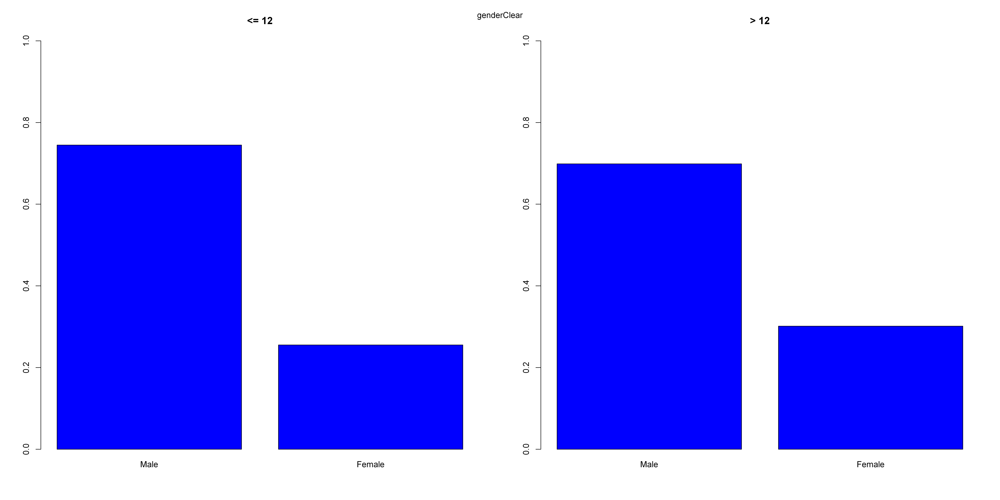

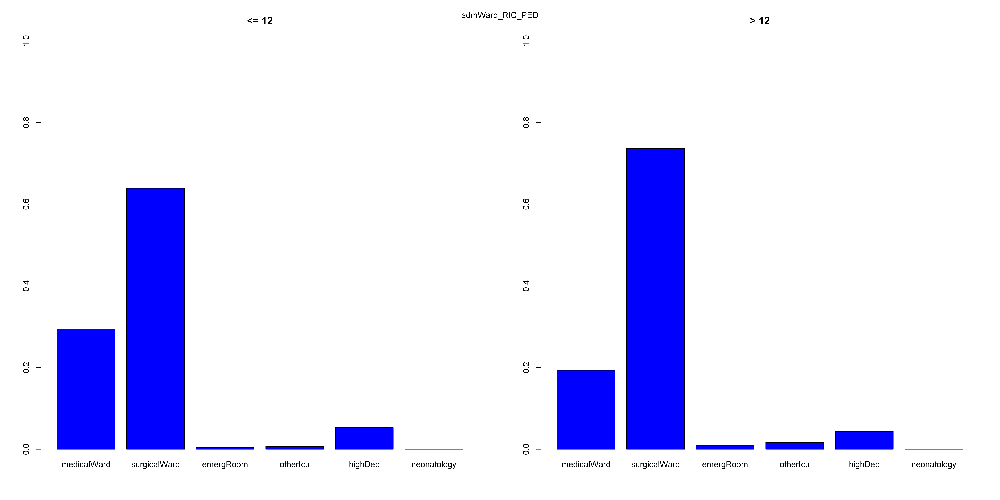

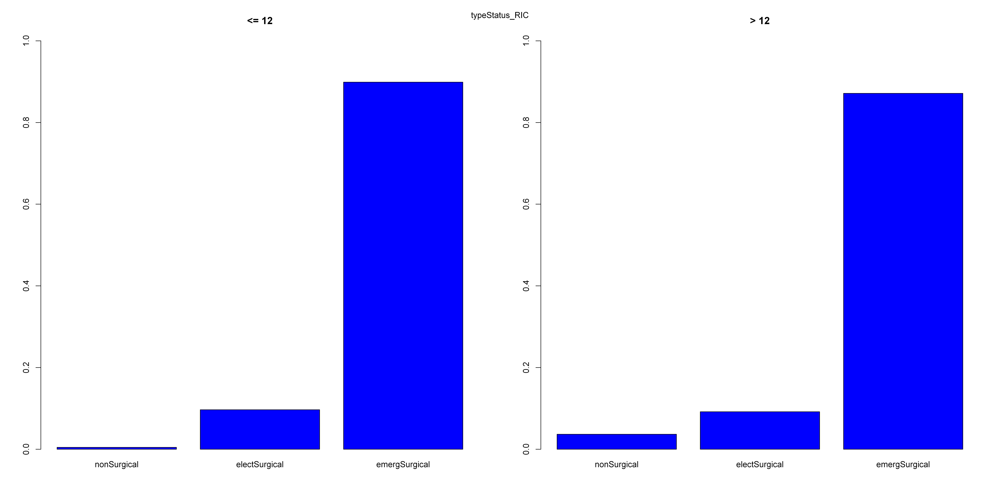

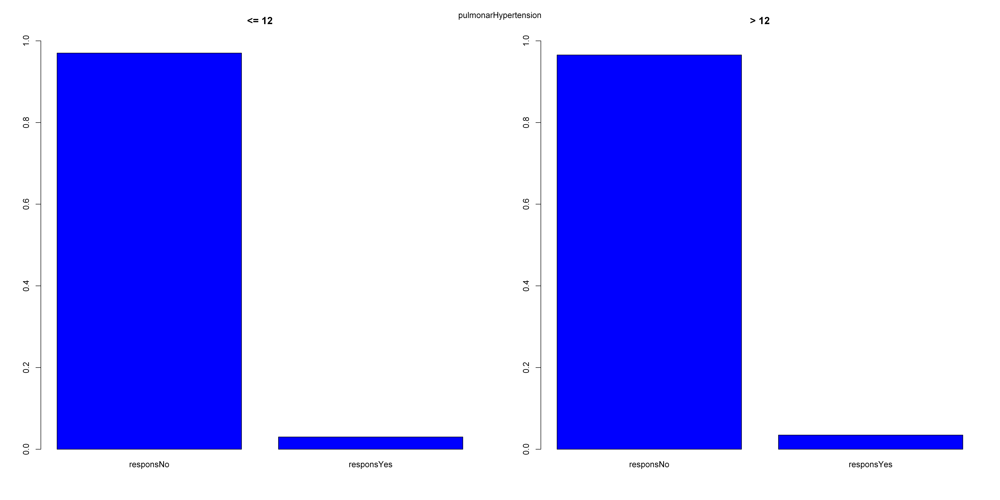

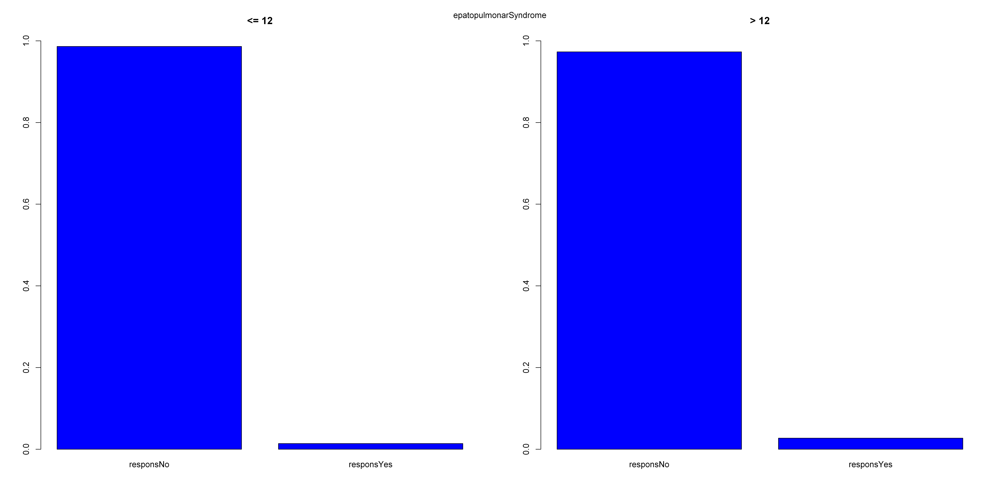

...

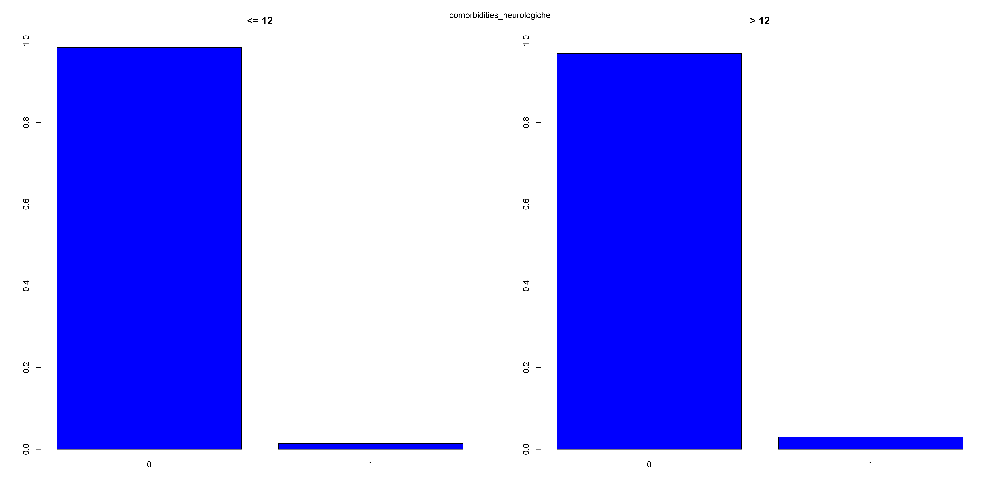

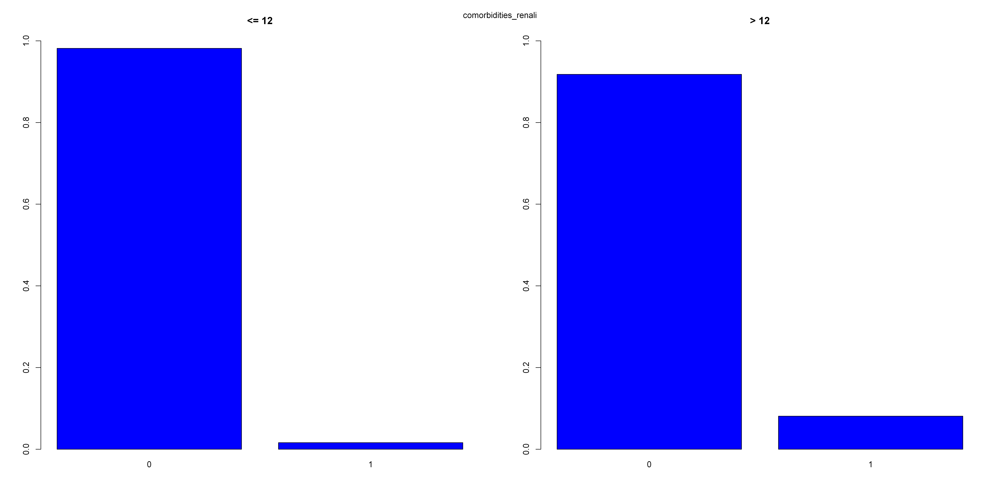

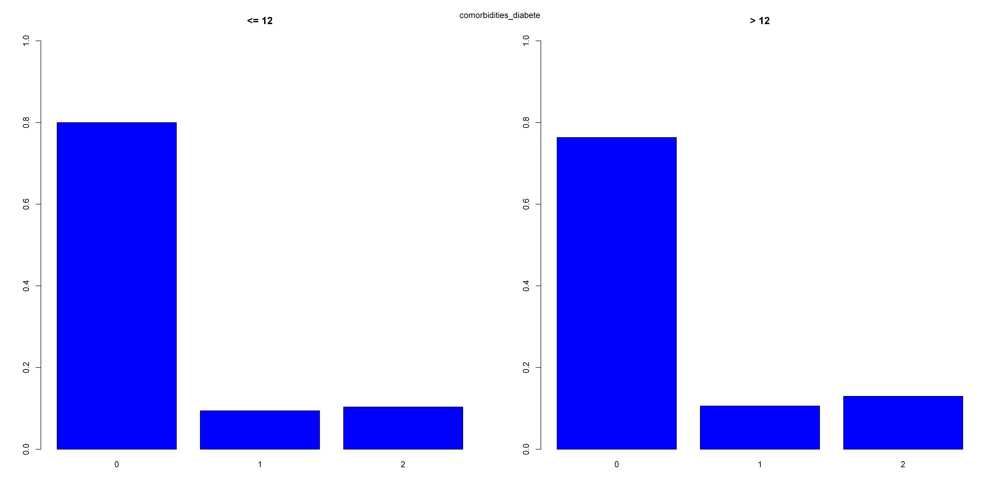

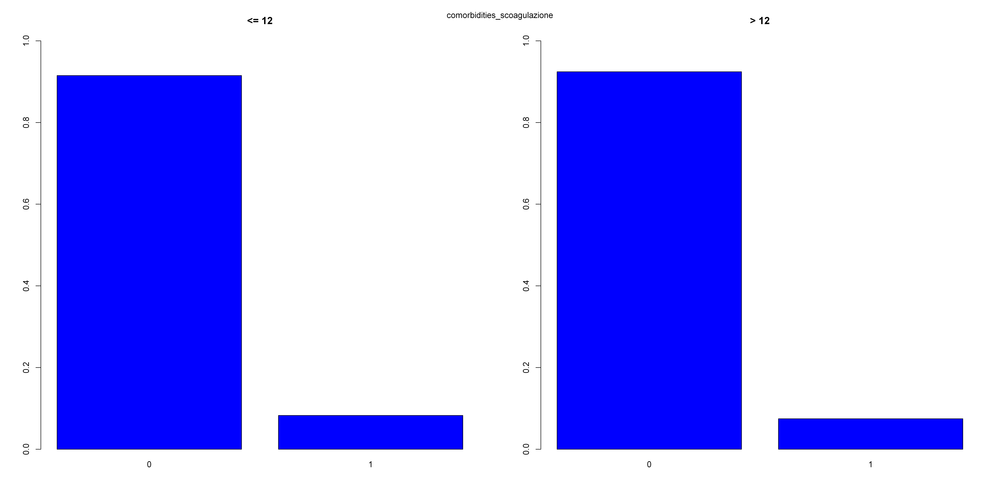

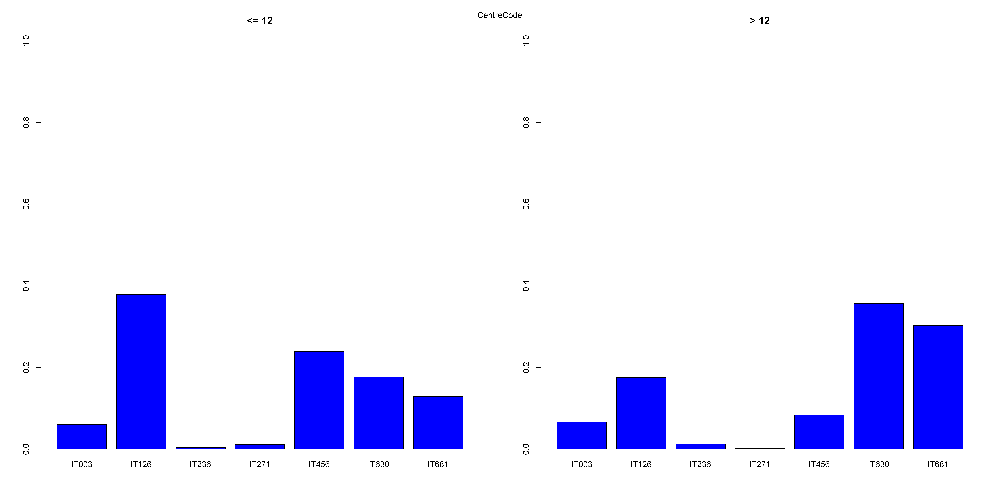

In [96]:
descrittiva_discrete(df_discrete1,df_discrete2)

In [97]:
descrittiva_discrete2(df_discrete1,df_discrete2)

[1] "genderClear"
[1] "<= 12"

     Male    Female 
0.7448276 0.2551724 
[1] "> 12"

     Male    Female 
0.6987041 0.3012959 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "admWard_RIC_PED"
[1] "<= 12"

 medicalWard surgicalWard    emergRoom     otherIcu      highDep  neonatology 
 0.294930876  0.640552995  0.004608295  0.006912442  0.052995392  0.000000000 
[1] "> 12"

 medicalWard surgicalWard    emergRoom     otherIcu      highDep  neonatology 
  0.19351351   0.73729730   0.00972973   0.01621622   0.04324324   0.00000000 


Warning message in ks.test(a, b):
"cannot compute exact p-value with ties"



	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.33333, p-value = 0.8928
alternative hypothesis: two-sided





[1] "typeStatus_RIC"
[1] "<= 12"

  nonSurgical electSurgical emergSurgical 
  0.004597701   0.096551724   0.898850575 
[1] "> 12"

  nonSurgical electSurgical emergSurgical 
   0.03671706    0.09179266    0.87149028 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.33333, p-value = 1
alternative hypothesis: two-sided





[1] "pulmonarHypertension"
[1] "<= 12"

 responsNo responsYes 
0.97011494 0.02988506 
[1] "> 12"

 responsNo responsYes 
0.96544276 0.03455724 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "epatopulmonarSyndrome"
[1] "<= 12"

 responsNo responsYes 
 0.9862069  0.0137931 
[1] "> 12"

 responsNo responsYes 
0.97300216 0.02699784 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "BleedingEsophagGastric"

Warning message in ks.test(a, b):
"cannot compute exact p-value with ties"



	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.6, p-value = 0.3291
alternative hypothesis: two-sided





[1] "albumInfusOver7Days"
[1] "<= 12"

 responsNo responsYes 
0.91034483 0.08965517 
[1] "> 12"

 responsNo responsYes 
 0.7667387  0.2332613 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "syndromeReperfus"
[1] "<= 12"

  notLevel       mild   moderate     severe 
0.40459770 0.40229885 0.15402299 0.03908046 
[1] "> 12"

  notLevel       mild   moderate     severe 
0.29481641 0.40064795 0.22678186 0.07775378 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.75, p-value = 0.2286
alternative hypothesis: two-sided





[1] "shuntPortedTemp"
[1] "<= 12"

 responsNo responsYes 
0.97471264 0.02528736 
[1] "> 12"

 responsNo responsYes 
0.97516199 0.02483801 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "anastomTechnic"
[1] "<

Warning message in ks.test(a, b):
"cannot compute exact p-value with ties"



	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 0.9639
alternative hypothesis: two-sided





[1] "frequency"
[1] "<= 12"

  Episodic  Appellant Persistent 
0.63461538 0.32692308 0.03846154 
[1] "> 12"

  Episodic  Appellant Persistent 
 0.6164384  0.2671233  0.1164384 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 1, p-value = 0.1
alternative hypothesis: two-sided





[1] "degree"
[1] "<= 12"

   degreeI   degreeII  degreeIII   degreeIV 
0.30769231 0.53846154 0.13461538 0.01923077 
[1] "> 12"

   degreeI   degreeII  degreeIII   degreeIV 
0.40753425 0.41095890 0.13698630 0.04452055 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.75, p-value = 0.2286
alternative hypothesis: two-sided





[1] "organDonorMaastricht"
[1] "<= 12"

    classI    classII   classIII    classIV     classV 
0.04347826 0.06521739 0.80434783 0.04347826 0.04347826 
[1] "> 12"

  classI  classII classIII  classIV   classV 
  0.0125   0.1875   0.7625   0.0375   0.0000 

Warning message in ks.test(a, b):
"cannot compute exact p-value with ties"



	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.4, p-value = 0.8186
alternative hypothesis: two-sided





[1] "organDonorSteadyMacroscopic"
[1] "<= 12"

    under30      30to60       sup60 
0.939597315 0.057046980 0.003355705 
[1] "> 12"

    under30      30to60       sup60 
0.925000000 0.071666667 0.003333333 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.33333, p-value = 1
alternative hypothesis: two-sided





[1] "organDonorRecondHypoNormoter"
[1] "<= 12"

   Oxygenated NotOxygenated 
   0.94615385    0.05384615 
[1] "> 12"

   Oxygenated NotOxygenated 
   0.91780822    0.08219178 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "comorbidities_none_RIC"
[1] "<= 12"

         1          0 
0.09907834 0.90092166 
[1] "> 12"

         1          0 
0.04540541 0.95459459 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "comor

In [98]:
descrittiva_discrete3(df_discrete1,df_discrete2)

[1] "genderClear"
   Cell Contents 
|-------------------------|
|                   Count | 
|         Expected Values | 
|             Row Percent | 
|            Std Residual | 
|-------------------------|

           Male   Female   Total
--------------------------------
a          324      111     435 
         310.3    124.7         
          74.5%    25.5%   32.0%
         0.775   -1.223         
--------------------------------
b          647      279     926 
         660.7    265.3         
          69.9%    30.1%   68.0%
        -0.531    0.838         
--------------------------------
Total      971      390    1361 

Statistics for All Table Factors

Pearson's Chi-squared test with simulated p-value
	 (based on 2000 replicates) 
------------------------------------------------------------
Chi^2 = 3.079773      d.f. = NA      p = 0.086 

Pearson's Chi-squared test with simulated p-value
	 (based on 2000 replicates) 
---------------------------------------------------------

Warning message in chisq.test(tab, correct = FALSE, ...):
"cannot compute simulated p-value with zero marginals"
Warning message in chisq.test(tab, correct = FALSE, ...):
"Chi-squared approximation may be incorrect"


   Cell Contents 
|-------------------------|
|                   Count | 
|         Expected Values | 
|             Row Percent | 
|            Std Residual | 
|-------------------------|

         medclWrd   srgclWrd   emergRom   otherIcu   highDep   neontlgy    Total
--------------------------------------------------------------------------------
a            128        278          2          3        23          0      434 
            98.0      306.6        3.5        5.7      20.1        0.0          
            29.5%      64.1%       0.5%       0.7%      5.3%       0.0%    31.9%
           3.026     -1.632     -0.807     -1.146     0.642        NaN          
--------------------------------------------------------------------------------
b            179        682          9         15        40          0      925 
           209.0      653.4        7.5       12.3      42.9        0.0          
            19.4%      73.7%       1.0%       1.6%      4.3%       0.0%    68.1%

In [99]:
descrittiva_continue(df_continue1, df_continue2)

[1] "<= 12"
[1] "age"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  14.00   53.50   59.00   57.25   65.00   75.00 
[1] "> 12"
[1] "age"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  19.00   52.00   58.00   56.17   63.00   75.00 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 218924, p-value = 0.009522
alternative hypothesis: true location shift is not equal to 0





[1] "<= 12"
[1] "degenzaPreTra"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   0.00    0.00    1.00    3.35    1.00  365.00       1 
[1] "> 12"
[1] "degenzaPreTra"
    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-260.000    0.250    1.000    7.557    5.000  304.000 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 164261, p-value = 6.915e-09
alternative hypothesis: true location shift is not equal to 0





[1] "<= 12"
[1] "bilirubinaTotale"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.200  

## Totale

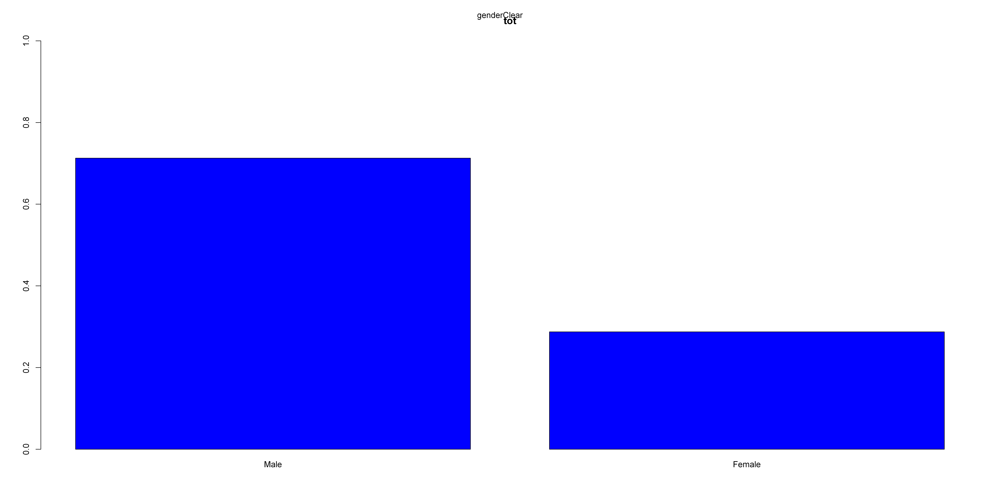

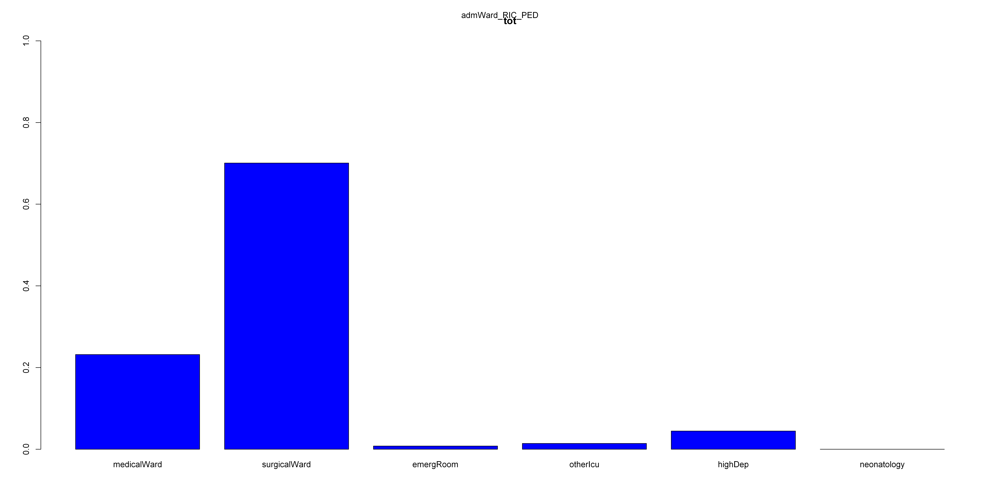

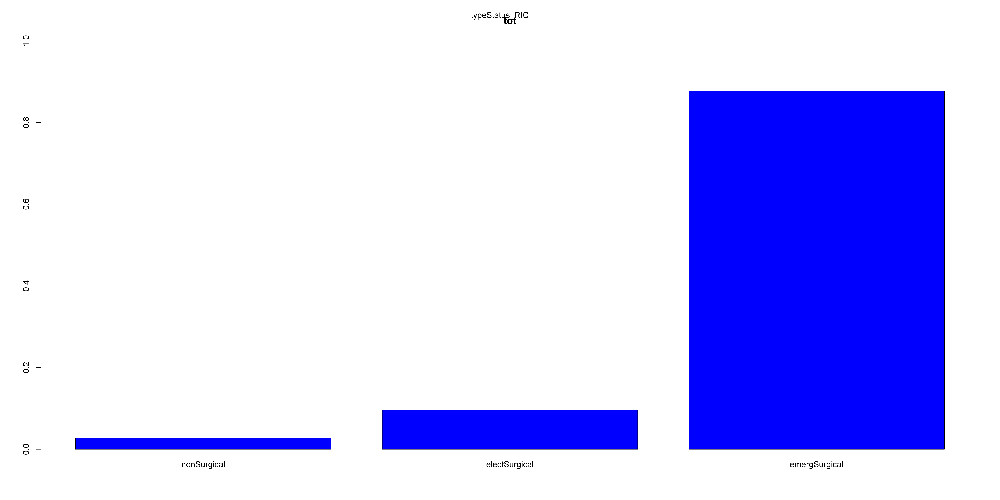

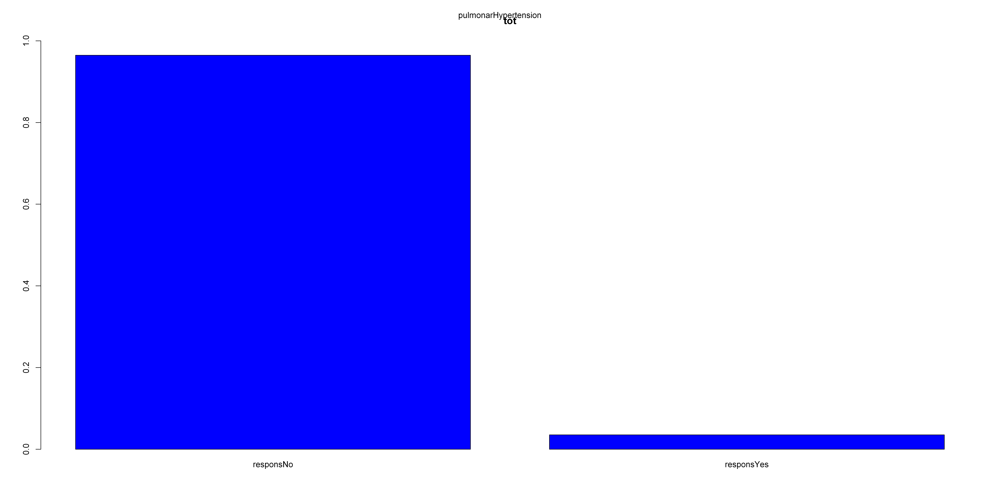

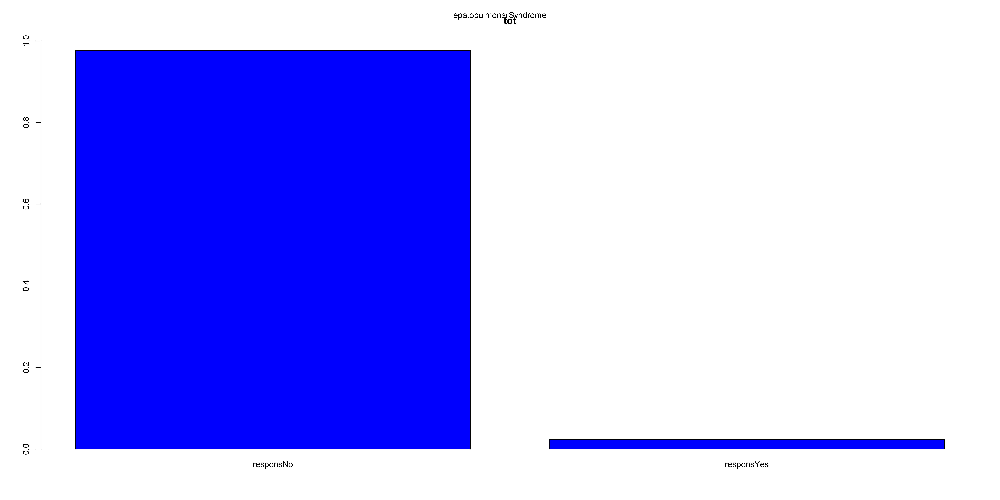

...

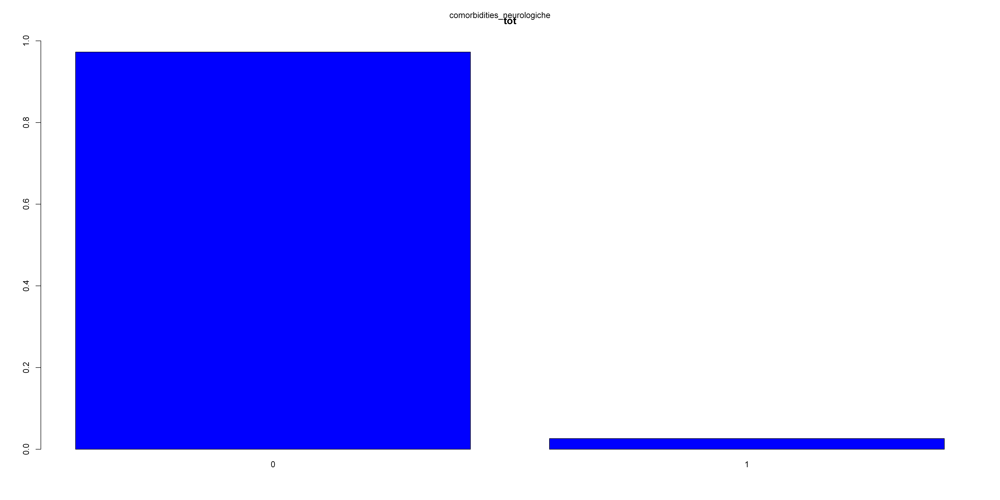

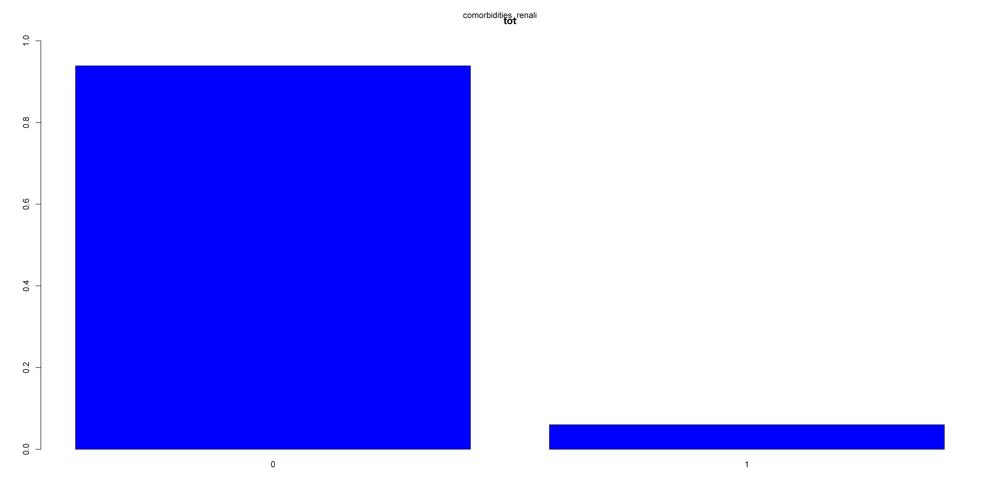

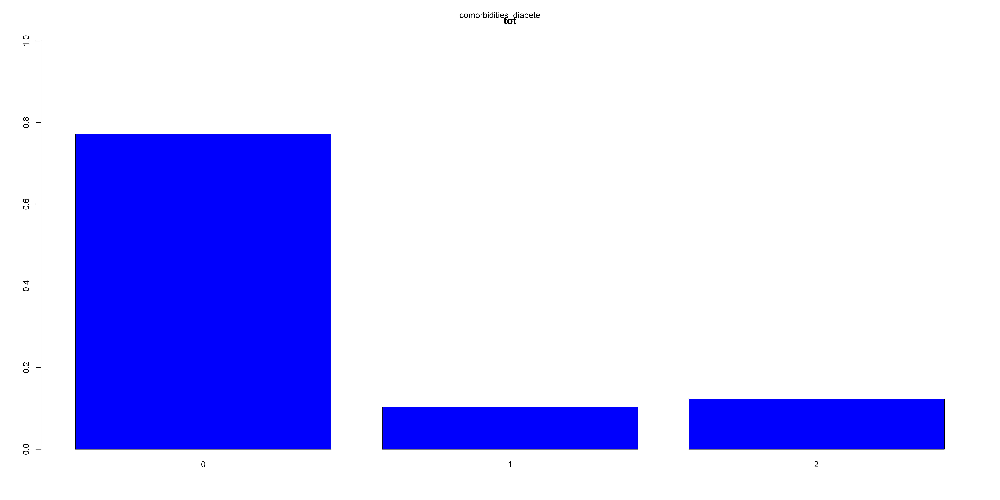

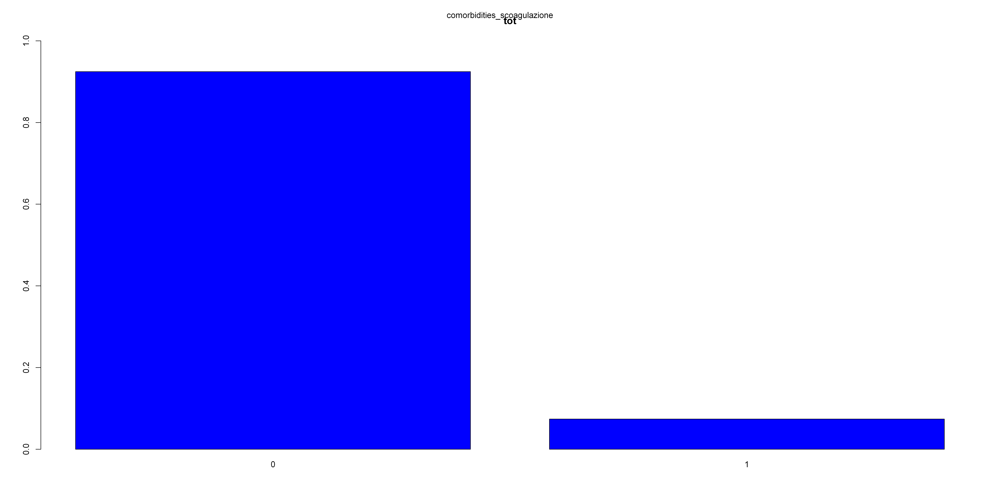

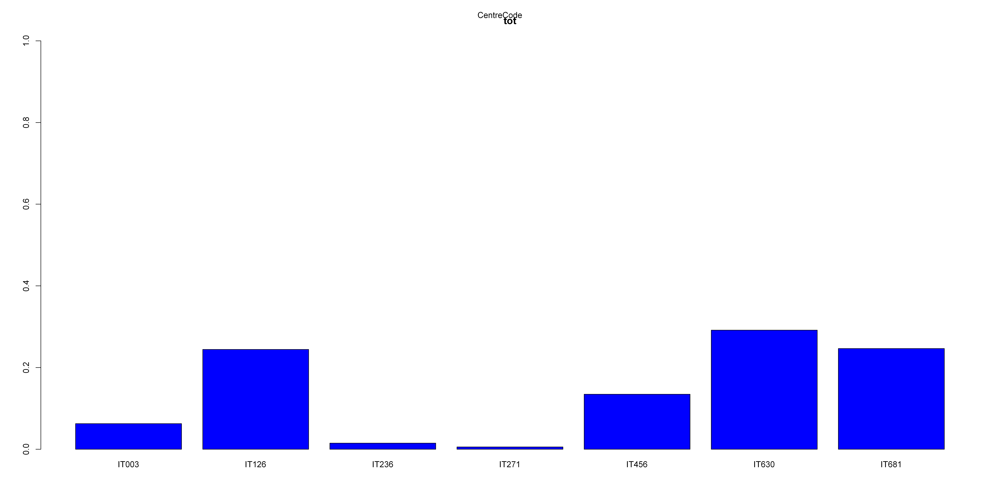

In [100]:
descrittiva_discrete_tot(df_discrete_tot)

In [101]:
descrittiva_discrete2_tot(df_discrete_tot)

[1] "genderClear"
[1] "tot"

     Male    Female 
0.7126761 0.2873239 




[1] "admWard_RIC_PED"
[1] "tot"

 medicalWard surgicalWard    emergRoom     otherIcu      highDep  neonatology 
 0.232016925  0.701692525  0.007757405  0.014104372  0.044428773  0.000000000 




[1] "typeStatus_RIC"
[1] "tot"

  nonSurgical electSurgical emergSurgical 
   0.02746479    0.09577465    0.87676056 




[1] "pulmonarHypertension"
[1] "tot"

 responsNo responsYes 
0.96478873 0.03521127 




[1] "epatopulmonarSyndrome"
[1] "tot"

 responsNo responsYes 
0.97605634 0.02394366 




[1] "BleedingEsophagGastric"
[1] "tot"

 responsNo responsYes 
 0.8077465  0.1922535 




[1] "prevLiverTransplant"
[1] "tot"

 responsNo responsYes 
0.96197183 0.03802817 




[1] "presentRefractAscites"
[1] "tot"

  priority       mild     severe   notLevel 
0.05211268 0.18169014 0.19225352 0.57394366 




[1] "tipps"
[1] "tot"

 responsNo responsYes 
 0.8943662  0.1056338 




[1] "thrombosisDegreeWithNone"
[1] "tot"

   deg

In [102]:
descrittiva_discrete3_tot(df_discrete_tot)

ERROR: Error in descrittiva_discrete3_tot(df_discrete_tot): non trovo la funzione "descrittiva_discrete3_tot"


In [103]:
descrittiva_continue_tot(df_continue_tot)

[1] "tot"
[1] "age"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  14.00   52.00   58.00   56.55   63.25   75.00 




[1] "tot"
[1] "degenzaPreTra"
    Min.  1st Qu.   Median     Mean  3rd Qu.     Max.     NA's 
-260.000    0.000    1.000    6.413    2.000  365.000        1 




[1] "tot"
[1] "bilirubinaTotale"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.1000  0.9975  2.1950  5.8865  5.5925 88.0000 




[1] "tot"
[1] "INR"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.800   1.200   1.400   1.624   1.820  10.000 




[1] "tot"
[1] "serumCreatinine"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.230   0.700   0.870   1.089   1.130  10.720 




[1] "tot"
[1] "Sodiemia"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  119.0   135.0   138.0   137.6   140.0   166.0 




[1] "tot"
[1] "ratioPaO2FiO2"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   97.0   300.0   386.0   367.1   433.0   500.0 




[1] "tot"
[1] "platCountTranspl"
   Min. 1st Qu.  Median    Mean 3